In [1]:
cd ..

/Users/maxcohen/Documents/Python/NYC Data/NYPD-arrests


In [2]:
ls

2010 Census Tracts/
ACS5yearBK/
CCRB Data Layout Table.xlsx
NYC Street Centerline (CSCL)/
NYC_Police_Precincts_2020/
NYPD-repository/
NYPD_Arrest_Historic_DataDictionary.xlsx
NYPD_Arrests_Data__Historic_.csv
NYPD_Criminal_Court_Summons__Historic_.csv
allegations_20200726939.csv
nyc_2010censusblocks_2020policeprecincts (1).csv


In [65]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline
import geopandas as gpd
from scipy.stats import gaussian_kde
import seaborn as sns
from shapely.geometry import shape, Point
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.dates as mdates
import plotly.express as px
import plotly.graph_objects as go

POSSIBLE AREAS OF INTEREST

What crimes disproprtionatly affect black people?
- Search for Marijuana in the arrest dataset
    - Are marijuana crimes more likely to result in serious charges for black people?
    
Where do certain arrests happen?
- Where are people arrested for marijuana? Robbery? Sexual assault?

Arrests per thousand (best metric?)

Most common words in arrest charges by race? Gender?

Gender or age differences?

What precincts are the "worst"?

Map the racial arrest gap
The goal here is to create a visualization of where black people are disproportionatly arrested
- Most readily done by finding the census demographics at each arrest lat/lon
    - Then compare the census demo to the arrest demo and determine how far off it is
    - For example: in x census tract, black people make up 30% of the population but are 75% of the arrests

Sources
- NYC Centerline Data 
-- https://data.cityofnewyork.us/City-Government/NYC-Street-Centerline-CSCL-/exjm-f27b
- NYTimes Mapping Segregation
-- https://www.nytimes.com/interactive/2015/07/08/us/census-race-map.html?mtrref=www.google.com&assetType=PAYWALL
- US Census Population Data
-- https://www.census.gov/quickfacts/fact/table/kingscountybrooklynboroughnewyork,newyorkcitynewyork/PST045219
- Racial Dot Map
-- http://racialdotmap.demographics.coopercenter.org/
- NYPD Precincts Map
-- https://data.cityofnewyork.us/Public-Safety/Police-Precincts/78dh-3ptz
- NYPD Arrests Data
-- https://data.cityofnewyork.us/Public-Safety/NYPD-Arrests-Data-Historic-/8h9b-rp9u
- NYC Census Tracts Data
-- https://data.cityofnewyork.us/City-Government/2010-Census-Tracts/fxpq-c8ku
- ACS Tables
-- https://data.census.gov/cedsci/
- NHGIS
-- https://data2.nhgis.org/main
- Precinct Data
-- https://johnkeefe.net/nyc-police-precinct-and-census-data
- Marijuana Consumption
-- https://www1.nyc.gov/site/doh/about/press/pr2019/health-department-releases-first-comprehensive-report-on-cannabis.page

Important Resources
- https://python-graph-gallery.com/134-how-to-avoid-overplotting-with-python/
- https://python-graph-gallery.com/86-avoid-overlapping-in-scatterplot-with-2d-density/
- https://datashader.org/getting_started/Introduction.html
- https://seaborn.pydata.org/generated/seaborn.kdeplot.html
- http://andrewgaidus.com/Dot_Density_County_Maps/
- https://towardsdatascience.com/walkthrough-mapping-basics-with-bokeh-and-geopandas-in-python-43f40aa5b7e9
- https://www.bloomberg.com/news/articles/2013-05-30/the-most-important-population-statistic-that-hardly-ever-gets-talked-about
- https://www.census.gov/data/tables/2015/demo/metro-micro/commuting-flows-2015.html
- https://wagner.nyu.edu/files/rudincenter/dynamic_pop_manhattan.pdf

### LOAD ALL DATA

In [4]:
#census tract map of Brooklyn
census_tracts = gpd.read_file(
    '2010 Census Tracts/geo_export_7c8515b7-143e-4d01-972b-35868adf5281.shp')
bk_census_tracts = census_tracts[census_tracts['boro_name'] == 'Brooklyn']

In [5]:
#ACS census tract demo data
acs_demo = pd.read_csv('ACS5yearBK/ACS5yearBK_data.csv', skiprows=0).drop(['Unnamed: 0'], axis=1)
#ACS census tract demo data dictionary
acs_data_dict = pd.read_csv('ACS5yearBK/ACS5yearBK_data_dict.csv',skiprows=1)

In [6]:
#street centerline map of nyc
our_streets = gpd.read_file('NYC Street Centerline (CSCL)/geo_export_c00f9a7a-d11b-4436-bc33-9fcb9a060d9d.shp')

In [7]:
#Borough Codes
# 1-Man 2-Bronx 3-Brooklyn 4-Queens 5-Staten Island
#brooklyn streets
bk_base = (our_streets[(our_streets['borocode'] == '3') & #brooklyn=3 
                       (our_streets['rw_type'] != 14)]) #remove ferry routes

In [8]:
#create a baselayer for non-bk centerline map
notbk_base = (our_streets[(our_streets['borocode'] != '3') & #brooklyn=3 
                       (our_streets['rw_type'] != 14)]) #remove ferry routes

In [9]:
#read column dictionary
xls = pd.ExcelFile('NYPD_Arrest_Historic_DataDictionary.xlsx')
arrest_col_info = pd.read_excel(xls, 'Column Info', header=1)
#delete filler columns with NaN vals
col_info = arrest_col_info.drop(columns=list(arrest_col_info.columns[2:]))

In [10]:
#read arrests file
df = pd.read_csv('NYPD_Arrests_Data__Historic_.csv')

In [11]:
#precinct shapefile
precinct_shp = gpd.read_file('NYC_Police_Precincts_2020/geo_export_87553334-fdcd-4d0c-8ab2-43a5e2975733.shp')

In [12]:
#precinct census data
precinct_census = pd.read_csv('nyc_2010censusblocks_2020policeprecincts (1).csv').drop('Unnamed: 0',axis=1)\
.dropna(subset=['precinct_2020'])

### CLEAN ARRESTS DATA

In [ ]:
def clean_arrests_data(df):
    #limit arrest file to Brooklyn
    df = df[ (df['Latitude'] < 40.8) & (df['ARREST_BORO'] == 'K') ]
    #change arrest dates to datetime
    df['ARREST_DATE'] = pd.to_datetime(df['ARREST_DATE'])
    #limit jurisdiction codes to 0->3
    df['JURISDICTION_CODE'] = df['JURISDICTION_CODE'].apply(lambda x: 3 if x>2 else x)
    
    #Limit age groups to 6 main categories
    #First, create the list of the 6 main category labels
    age_groups = df['AGE_GROUP'].value_counts().sort_values(ascending=False)[:5].index.to_list()
    #Write eveything that is not in one of these categories as NaN
    df['AGE_GROUP'] = df['AGE_GROUP'].apply(lambda x: np.nan if x not in age_groups else x)
    #turn all of those NaN age_group values into real age groups based on the proportion of age groups in the data
    #1. make a dictionary of the age groups and their percentages in the data
    age_group_dict = dict(df['AGE_GROUP'].value_counts(normalize=True))
    age_group_keys = list(age_group_dict.keys())
    age_group_values = list(age_group_dict.values())
    #2. randomly fillna with the proportion of each value
    df['AGE_GROUP'] = df['AGE_GROUP'].fillna(
        pd.Series(np.random.choice(age_group_keys, p=age_group_values, size=len(df))))
    
    #Group "black hispanic" and "white hispanic" into "hispanic"
    #This could be flawed
    #*** Before combining, "White Hispanic" was 26% and "Black Hispanic" was 8% ***
    df['PERP_RACE'] = df['PERP_RACE'].apply(lambda x: 'HISPANIC' if x.endswith('HISPANIC') else x)

    #create columbs for year, month, day
    df['ARREST_YEAR'] = df['ARREST_DATE'].apply(lambda x: x.year)
    df['ARREST_MONTH'] = df['ARREST_DATE'].apply(lambda x: x.month)
    df['ARREST_DAY'] = df['ARREST_DATE'].apply(lambda x: x.day)

    #combine lat/lon into one column
    df['lonlat'] = list(zip(df['Longitude'], df['Latitude']))
    #convert lat/lon into "points"
    df['point'] = df['lonlat'].apply(lambda x: Point(x))

    #create day of year column that find the day number of the year
    df['dayofyear'] = df['ARREST_DATE'].apply(lambda x: x.timetuple().tm_yday)
    
    return df

In [15]:
#number of unique values in all of the arrest description columns'
for i in df.columns[2:8]:
    uni_vals = len(df[i].value_counts().sort_values(ascending=False))
    print(str(i) + ' | ' + str(uni_vals))

PD_CD | 316
PD_DESC | 388
KY_CD | 73
OFNS_DESC | 82
LAW_CODE | 1870
LAW_CAT_CD | 4


In [22]:
#most common arresting precincts
df['ARREST_PRECINCT'].value_counts().sort_values(ascending=False)

75     171855
73     138429
79      91083
67      88629
83      79377
77      77582
70      69708
71      65865
60      63197
81      62318
84      60479
90      52706
72      51415
61      42255
69      39900
88      36229
62      35155
68      32542
63      31540
76      29129
78      26467
66      24892
94      21906
104         1
106         1
Name: ARREST_PRECINCT, dtype: int64

### DEOMGRAPHICS AND ACS DATA CLEANING

Black people are 33.9% of the BK population, but account for 61.9% of the arrests

In [23]:
df['PERP_RACE'].value_counts(normalize=True)

BLACK                             0.618931
HISPANIC                          0.228247
WHITE                             0.119901
ASIAN / PACIFIC ISLANDER          0.024745
UNKNOWN                           0.006313
AMERICAN INDIAN/ALASKAN NATIVE    0.001692
OTHER                             0.000172
Name: PERP_RACE, dtype: float64

The goal here is to create a visualization of where black people are disproportionatly arrested
- Most readily done by finding the census demographics at each arrest lat/lon
    - Then compare the census demo to the arrest demo and determine how far off it is
    - For example: at x,x black people make up 50% of the population but are 75% of the arrests
   
Handling "Hispanic" census data
- https://www.census.gov/topics/population/hispanic-origin/about/comparing-race-and-hispanic-origin.html
- With the ACS data, we are looking for black people which should all be covered in the "race" categories

- Data steps
    1. ~~Create ACS column that corresponds to census tract names
    2. ~~Collect all the relevant demographics columns in ACS dataframe
    3. ~~Merge the census tract data with the demographic data (or vice verse)
    4. ~~Once those are merged, we have the following:
        - Demo data for each cesnsus tract in Brooklyn
        - Shapefile data for each census tract in BK
    5. ~~Associate each arrest location with a census tract based on the lat/lon data
        - Something like a lambda function that looks at each lat/lon and puts it into a specific census tract
    6. ~~Now we can group by each lat/lon and compare arrest demos to the baseline residency demos

In [24]:
#remove margin of error columns
acs_demo = acs_demo[acs_demo.columns.drop(list(acs_demo.filter(regex='Margin of Error')))]

In [25]:
#create ctlabel column with just the "number" name of census tract
#now this will match the bk_census_tract column
acs_demo['ctlabel'] = acs_demo['Geographic Area Name']\
.apply(lambda x: x.split('Census Tract ')[1].split(', Kings County')[0])

In [27]:
#acs_demo.to_csv('ACS5yearBK/ACS5yearBK_data.csv')

In [28]:
#columns that account for all black people (of one race or multiple) in a given census tract
black_pop_columns = ['Estimate!!Race alone or in combination with one or more other races!!Total population!!Black or African American',
                     'Percent Estimate!!Race alone or in combination with one or more other races!!Total population!!Black or African American']

In [29]:
#add census tract label to the list so that we can create an abbreviated dataframe
black_pop_columns.insert(0,'ctlabel')

In [30]:
#filter dataframe to only include black population columns
ct_black_pop = acs_demo[black_pop_columns]

In [31]:
#census tract lengths are different, find out which one
#after looking, census tract 9901 from the ACS data has no population, so I will ignore it
pd.Index(ct_black_pop.ctlabel).difference(pd.Index(bk_census_tracts.ctlabel)).values

array(['9901'], dtype=object)

In [32]:
#merge the black pop data onto the bk_census_tracts (shortened to just geometry and census tract name)
ct_black_pop = bk_census_tracts[['ctlabel','geometry']].merge(ct_black_pop, on='ctlabel')

In [33]:
#rename columns
ct_black_pop.rename(columns={'Estimate!!Race alone or in combination with one or more other races!!Total population!!Black or African American':'total_pop',
                            'Percent Estimate!!Race alone or in combination with one or more other races!!Total population!!Black or African American':'perc_pop'},
                   inplace=True)

5. Associate each arrest location with a census tract based on the lat/lon data
        - Something like a lambda function that looks at each lat/lon and puts it into a specific census tract
        
If lat/lon is in a polygon, return that polygon in a new column 
then df.merge(ct_black_pop, on='geometry')

In [34]:
#combine lat/lon into one column
df['lonlat'] = list(zip(df['Longitude'], df['Latitude']))

In [35]:
#convert lat/lon into "points"
df['point'] = df['lonlat'].apply(lambda x: Point(x))

In [36]:
#copy the geometry column because we will need a copy when we join the dataframes
ct_black_pop['ctpoly'] = ct_black_pop['geometry']

In [37]:
#turn df into a GeoDataFrame
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['Longitude'],df['Latitude']))

In [38]:
#sjoin arrest df with black pop df on the geometry column (left=point, right=polygon)
#sjoin determines if the point is intersecting any part of the polygon
#THIS IS SO SIIIIICK
#and is so faaaaast
%time
gdf = gpd.sjoin(gdf, ct_black_pop, how='left', op='intersects')

CPU times: user 5 µs, sys: 1 µs, total: 6 µs
Wall time: 11 µs


/Users/maxcohen/opt/anaconda3/lib/python3.7/site-packages/geopandas/tools/sjoin.py:61: UserWarning: CRS of frames being joined does not match!(None != {'init': 'epsg:4326'})
  "(%s != %s)" % (left_df.crs, right_df.crs)


In [39]:
#remove NAs
gdf.dropna(inplace=True)

In [40]:
#Function creates a dataframe that is grouped by a geo tag and then returns a new dataframe 
    #of racial disparity in arrests at that geo tag
def geo_combine_arrest_pop(cols):
    geo_race = gdf.groupby(cols).size()\
    .groupby(level=[0])\
    .apply(lambda x: 100 * x / float(x.sum()))\
    .reset_index()\
    .rename(columns={0:'perc_arrest'})
    geo_race_black = geo_race[geo_race['PERP_RACE'] == 'BLACK']
    geo_combo_arrest_pop = geo_race_black.merge(ct_black_pop[['ctlabel','perc_pop','total_pop','geometry']], 
                                                on='ctlabel')
    geo_combo_arrest_pop['perc_pop'] = geo_combo_arrest_pop['perc_pop'].replace('-','0.0').astype('float')
    geo_combo_arrest_pop['diff'] = geo_combo_arrest_pop['perc_arrest'] - geo_combo_arrest_pop['perc_pop']
    geo_combo_arrest_pop = gpd.GeoDataFrame(geo_combo_arrest_pop, geometry=geo_combo_arrest_pop['geometry'])
    return geo_combo_arrest_pop

In [41]:
#use geo function to group by censustract
ct_combo_arrest_pop = geo_combine_arrest_pop(['ctlabel','PERP_RACE'])

In [42]:
#use geo function to group by lat/lon
lonlat_combo_arrest_pop = geo_combine_arrest_pop(['Longitude','Latitude','ctlabel','PERP_RACE'])

Plot side by side the most common arrest type and percent of population that is white

In [ ]:
def geo_arrest_type(cols):
    ct_arrest_type = gdf.groupby(cols).size()\
    .groupby(level=[0])\
    .apply(lambda x: 100 * x / float(x.sum()))\
    .reset_index()\
    .rename(columns={0:'perc_arrest'})
    ct_arrest_type_max = ct_arrest_type.groupby('ctlabel')['perc_arrest'].max()\
    .reset_index().merge(ct_arrest_type,on=['ctlabel','perc_arrest'])\
    .merge(bk_census_tracts[['ctlabel','geometry']],on='ctlabel')\
    .merge(acs_demo[['ctlabel','Estimate!!RACE!!Total population']],on='ctlabel')
    ct_arrest_type_max = gpd.GeoDataFrame(ct_arrest_type_max, geometry=ct_arrest_type_max['geometry'])
    top5_pd_desc = ct_arrest_type_max['PD_DESC'].value_counts()[:5].index
    ct_arrest_type_max['PD_DESC_top5'] = ct_arrest_type_max['PD_DESC']\
    .apply(lambda x: x if x in top5_pd_desc else 'Other').str.capitalize()

In [ ]:
#find most common PD_DESC for each census tract

In [157]:
ct_arrest_type = gdf.groupby(['ctlabel','PD_DESC']).size()\
.groupby(level=[0])\
.apply(lambda x: 100 * x / float(x.sum()))\
.reset_index()\
.rename(columns={0:'perc_arrest'})

In [191]:
ct_arrest_type_max = ct_arrest_type.groupby('ctlabel')['perc_arrest'].max()\
.reset_index().merge(ct_arrest_type,on=['ctlabel','perc_arrest'])\
.merge(bk_census_tracts[['ctlabel','geometry']],on='ctlabel')\
.merge(acs_demo[['ctlabel','Estimate!!RACE!!Total population']],on='ctlabel')

In [247]:
ct_arrest_type_max = gpd.GeoDataFrame(ct_arrest_type_max, geometry=ct_arrest_type_max['geometry'])

In [248]:
top5_pd_desc = ct_arrest_type_max['PD_DESC'].value_counts()[:5].index

In [249]:
ct_arrest_type_max['PD_DESC_top5'] = ct_arrest_type_max['PD_DESC']\
.apply(lambda x: x if x in top5_pd_desc else 'Other').str.capitalize()

In [ ]:
#find most common OFNS_DESC for each census tract

In [251]:
ct_arrest_ofns_desc = gdf.groupby(['ctlabel','OFNS_DESC']).size()\
.groupby(level=[0])\
.apply(lambda x: 100 * x / float(x.sum()))\
.reset_index()\
.rename(columns={0:'perc_arrest'})

In [252]:
ct_arrest_ofns_desc_max = ct_arrest_ofns_desc.groupby('ctlabel')['perc_arrest'].max()\
.reset_index().merge(ct_arrest_ofns_desc,on=['ctlabel','perc_arrest'])\
.merge(bk_census_tracts[['ctlabel','geometry']],on='ctlabel')\
.merge(acs_demo[['ctlabel','Estimate!!RACE!!Total population']],on='ctlabel')

In [253]:
ct_arrest_ofns_desc_max = gpd.GeoDataFrame(ct_arrest_ofns_desc_max, geometry=ct_arrest_ofns_desc_max['geometry'])

In [254]:
top5_ofns_desc = ct_arrest_ofns_desc_max['OFNS_DESC'].value_counts()[:5].index

In [256]:
ct_arrest_ofns_desc_max['OFNS_DESC_top5'] = ct_arrest_ofns_desc_max['OFNS_DESC']\
.apply(lambda x: x if x in top5_ofns_desc else 'Other').str.capitalize()

### GRAPHING ARRESTS OVER TIME

In [43]:
#create day of year column that find the day number of the year
df['dayofyear'] = df['ARREST_DATE'].apply(lambda x: x.timetuple().tm_yday)

In [54]:
#create new df that counts the number of arrests for each date
arrestsXdate = df['ARREST_DATE'].value_counts().reset_index().rename(columns={'index':'date',
                                                                              'ARREST_DATE':'count'})

In [55]:
#sort this df by date
arrestsXdate = arrestsXdate.sort_values(by='date')

In [56]:
#set the index as the date so that we can apply rolling means
arrestsXdate_index = arrestsXdate.set_index('date')

In [57]:
#7 day rolling mean
d7_rol_arr = arrestsXdate_index.rolling(window=7, center=True).mean()

In [58]:
#365 day rolling mean
d365_rol_arr = arrestsXdate_index.rolling(window=365, center=True).mean()

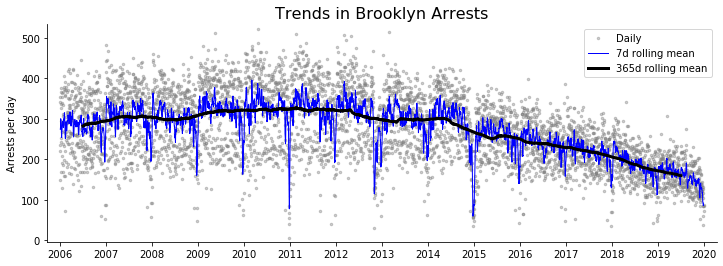

In [64]:
#number of arrests by day
fig,ax = plt.subplots(figsize=(12,4))

ax.plot(arrestsXdate_index['count'], marker='.', markersize=5, 
        alpha=.4, linestyle='None', color='grey', label='Daily')

ax.plot(d7_rol_arr['count'], color='blue', label='7d rolling mean', linewidth=1)

ax.plot(d365_rol_arr['count'], color='black', label='365d rolling mean', linewidth=3)

ax.legend()
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax.set_ylabel("Arrests per day")
ax.set_title('Trends in Brooklyn Arrests',fontsize=16)
plt.margins(.02)
#plt.savefig('NYPD-repository/figs/trends_bk_arrests.png', dpi=500, bbox_inches='tight')
plt.show()

In [97]:
#plotly chart

fig = go.Figure()

fig.add_trace(go.Scatter(x=arrestsXdate['date'], y=arrestsXdate['count'],
                         mode='markers', name='Daily',
                         marker=dict(
                             size=4,
                             color='Grey',
                             opacity=.4)))
fig.add_trace(go.Scatter(x=d7_rol_arr.index, y=d7_rol_arr['count'],
                         mode='lines', name='7d mean', 
                         line=dict(color='blue',
                                   width=1)))
fig.add_trace(go.Scatter(x=d365_rol_arr.index, y=d365_rol_arr['count'],
                         mode='lines', name='365d mean',
                         line=dict(color='black',
                                   width=3)))

fig.update_layout(
    title='Trends in BK Arrests',
    xaxis_title='Arrests per day',
    autosize=False,width=990,height=400,
    legend=dict(yanchor='top',y=.99,xanchor='right',x=.99,
                bgcolor='rgba(0,0,0,0)',bordercolor='lightblue',borderwidth=2))

fig.show()

### Arrests as a per 10000 number

In [ ]:
#calculate arrests per 10000

In [336]:
list(acs_demo.columns)

['id',
 'Geographic Area Name',
 'Estimate!!SEX AND AGE!!Total population!!65 years and over!!Sex ratio (males per 100 females)',
 'Percent Estimate!!SEX AND AGE!!Total population!!65 years and over!!Sex ratio (males per 100 females)',
 'Estimate!!RACE!!Total population',
 'Percent Estimate!!RACE!!Total population',
 'Estimate!!RACE!!Total population!!One race',
 'Percent Estimate!!RACE!!Total population!!One race',
 'Estimate!!RACE!!Total population!!Two or more races',
 'Percent Estimate!!RACE!!Total population!!Two or more races',
 'Estimate!!RACE!!Total population!!One race.1',
 'Percent Estimate!!RACE!!Total population!!One race.1',
 'Estimate!!RACE!!Total population!!One race!!White',
 'Percent Estimate!!RACE!!Total population!!One race!!White',
 'Estimate!!RACE!!Total population!!One race!!Black or African American',
 'Percent Estimate!!RACE!!Total population!!One race!!Black or African American',
 'Estimate!!RACE!!Total population!!One race!!American Indian and Alaska Native',


In [356]:
race_tot_columns = \
['ctlabel',
'Estimate!!RACE!!Total population',
'Estimate!!HISPANIC OR LATINO AND RACE!!Total population!!Hispanic or Latino (of any race)',
'Estimate!!HISPANIC OR LATINO AND RACE!!Total population!!Not Hispanic or Latino!!White alone',
'Estimate!!HISPANIC OR LATINO AND RACE!!Total population!!Not Hispanic or Latino!!Black or African American alone',
'Estimate!!HISPANIC OR LATINO AND RACE!!Total population!!Not Hispanic or Latino!!American Indian and Alaska Native alone',
'Estimate!!HISPANIC OR LATINO AND RACE!!Total population!!Not Hispanic or Latino!!Asian alone',
'Estimate!!HISPANIC OR LATINO AND RACE!!Total population!!Not Hispanic or Latino!!Native Hawaiian and Other Pacific Islander alone',
'Estimate!!HISPANIC OR LATINO AND RACE!!Total population!!Not Hispanic or Latino!!Some other race alone',
'Estimate!!HISPANIC OR LATINO AND RACE!!Total population!!Not Hispanic or Latino!!Two or more races']

In [358]:
pop_race_ctlabel = acs_demo[race_tot_columns]

In [362]:
pop_race_ctlabel.columns = [x.split('!!')[-1] for x in pop_race_ctlabel.columns]

In [372]:
pop_race_ctlabel = pop_race_ctlabel.append(pop_race_ctlabel.sum().rename('total'))

In [375]:
pop_race_ctlabel.loc['total','ctlabel'] = np.nan

In [380]:
pop_race_tot = pop_race_ctlabel[pop_race_ctlabel['ctlabel'].isnull()].drop('ctlabel', axis=1)

In [418]:
pop_race_tot_merge = \
pop_race_tot.transpose()['total'].rename({'Hispanic or Latino (of any race)':'HISPANIC',
                                         'White alone':'WHITE',
                                         'Black or African American alone':'BLACK',
                                         'American Indian and Alaska Native alone':'AMERICAN INDIAN/ALASKAN NATIVE',
                                         'Asian alone':'ASIAN / PACIFIC ISLANDER'}).reset_index()


In [427]:
pop_arrest_race = df['PERP_RACE'].value_counts().reset_index().merge(pop_race_tot_merge, how='inner', on='index')

In [437]:
def arr_rolling_mean_race(race, rolling_mean_days):
    df_ = df[df['PERP_RACE'] == race]['ARREST_DATE']\
    .value_counts().reset_index().rename(columns={'index':'date','ARREST_DATE':'count'})
    df_['PERP_RACE'] = race
    df_merge = df_.merge(pop_arrest_race[['index','total']], how='left', left_on='PERP_RACE', right_on='index')
    df_merge['arrest_rate'] = df_merge['count'] / (df_merge['total'] / 10000)
    df_2 = df_merge[['date','arrest_rate']].sort_values(by='date').set_index('date')
    return df_2.rolling(window=rolling_mean_days, center=True).mean().reset_index()

In [447]:
#plotly chart
fig = go.Figure()

black_7d_mean = arr_rolling_mean_race('BLACK',7)
hispanic_7d_mean = arr_rolling_mean_race('HISPANIC',7)
white_7d_mean = arr_rolling_mean_race('WHITE',7)
asian_7d_mean = arr_rolling_mean_race('ASIAN / PACIFIC ISLANDER',7)

four_races = [black_7, hispanic_7, white_7, asian_7]
colors = ['black','brown','green','orange']
names = ['Black','Hispanic','White','Asian']

fig.add_trace(go.Scatter(x=black_7d_mean['date'], y=black_7d_mean['arrest_rate'],
                         mode='lines', name='Black', 
                         line=dict(color='black',width=1)))

fig.add_trace(go.Scatter(x=hispanic_7d_mean['date'], y=hispanic_7d_mean['arrest_rate'],
                         mode='lines', name='Hispanic', 
                         line=dict(color='brown',width=1)))

fig.add_trace(go.Scatter(x=white_7d_mean['date'], y=white_7d_mean['arrest_rate'],
                         mode='lines', name='White', 
                         line=dict(color='green',width=1)))

fig.add_trace(go.Scatter(x=asian_7d_mean['date'], y=asian_7d_mean['arrest_rate'],
                         mode='lines', name='Asian', 
                         line=dict(color='orange',width=1)))

fig.update_layout(
    title='Trends in BK Arrests Rates by race',
    yaxis_title='Arrests per 10k residents',
    autosize=False,width=990,height=400,
    legend=dict(yanchor='top',y=.99,xanchor='right',x=.99,
                bgcolor='rgba(0,0,0,0)',bordercolor='lightblue',borderwidth=2))

fig.show()

### ARRESTS BY CHARGES

In [98]:
desc100 = df[df.groupby('PD_DESC')['PD_DESC'].transform('size') > 100]

In [99]:
desc100_perc = desc100.groupby(['PD_DESC','PERP_RACE']).size()\
    .groupby(level=[0])\
    .apply(lambda x: 100 * x / float(x.sum()))\
    .reset_index()\
    .rename(columns={0:'perc_arrest'})

In [100]:
desc100_perc[(desc100_perc['PERP_RACE'] == 'BLACK') & 
             (desc100_perc['perc_arrest'] > 61.8931)].sort_values(by='perc_arrest', ascending=False)

,PD_DESC,PERP_RACE,perc_arrest
878,RIOT 1,BLACK,87.407407
597,"LOITERING,GAMBLING,OTHER",BLACK,83.657588
1128,WEAPONS POSSESSION 1 & 2,BLACK,82.897652
279,CRIMINAL DISPOSAL FIREARM 1 & 2,BLACK,79.807692
998,"TAMPERING 1,CRIMINAL",BLACK,78.160237
...,...,...,...
361,"FORGERY,ETC.-MISD.",BLACK,62.430616
35,"AGRICULTURE & MARKETS LAW,UNCLASSIFIED",BLACK,62.357414
963,"STOLEN PROPERTY 2,1,POSSESSION,UNCLASSIFIED",BLACK,62.230869
19,AGGRAVATED CRIMINAL CONTEMPT,BLACK,62.211982


In [101]:
desc100_perc[(desc100_perc['PERP_RACE'] == 'WHITE') & 
             (desc100_perc['perc_arrest'] > 11.9901)].sort_values(by='perc_arrest', ascending=False)

,PD_DESC,PERP_RACE,perc_arrest
331,ENTERPRISE CORRUPTION,WHITE,68.393782
775,POSSESSION HYPODERMIC INSTRUMENT,WHITE,54.010695
291,"CRIMINAL MISCHIEF 4TH, GRAFFIT",WHITE,52.898551
376,"FORGERY,PRESCRIPTION",WHITE,47.540984
460,"IMPAIRED DRIVING,ALCOHOL",WHITE,35.893155
...,...,...,...
967,"STOLEN PROPERTY 2,1,POSSESSION,UNCLASSIFIED",WHITE,12.477302
858,RECKLESS ENDANGERMENT 1,WHITE,12.430556
1145,"WEAPONS, POSSESSION, ETC",WHITE,12.229109
303,"CRIMINAL MISCHIEF,UNCLASSIFIED 4",WHITE,12.087912


In [102]:
desc100_perc[(desc100_perc['PERP_RACE'] == 'HISPANIC') & 
             (desc100_perc['perc_arrest'] > 22.8247)].sort_values(by='perc_arrest', ascending=False)

,PD_DESC,PERP_RACE,perc_arrest
406,"GAMBLING 1,PROMOTING,POLICY",HISPANIC,76.942356
47,"ALCOHOLIC BEVERAGES,PUBLIC CON",HISPANIC,49.230769
789,"PROSTITUTION 4,PROMOTING&SECURING",HISPANIC,49.222798
254,"CONTROLLED SUBSTANCE,SALE 1",HISPANIC,48.550725
402,"GAMBLING 1,PROMOTING,BOOKMAKING",HISPANIC,46.543779
...,...,...,...
475,"IMPERSONATION 2, PUBLIC SERVAN",HISPANIC,23.030303
889,"ROBBERY,OPEN AREA UNCLASSIFIED",HISPANIC,22.928779
487,"IMPRISONMENT 1,UNLAWFUL",HISPANIC,22.916667
862,RECKLESS ENDANGERMENT 2,HISPANIC,22.880069


In [103]:
desc100_perc[(desc100_perc['PERP_RACE'] == 'ASIAN / PACIFIC ISLANDER') & 
             (desc100_perc['perc_arrest'] > 02.4745)].sort_values(by='perc_arrest', ascending=False)

,PD_DESC,PERP_RACE,perc_arrest
145,"CHILD,OFFENSES AGAINST,UNCLASSIFIED",ASIAN / PACIFIC ISLANDER,28.252788
1008,TAX LAW,ASIAN / PACIFIC ISLANDER,28.238269
969,"STOLEN PROPERTY 2,POSSESSION BY LICENSED DEA",ASIAN / PACIFIC ISLANDER,24.223602
783,"PROSTITUTION 3,PROMOTING BUSINESS",ASIAN / PACIFIC ISLANDER,22.105263
709,"NY STATE LAWS,UNCLASSIFIED FELONY",ASIAN / PACIFIC ISLANDER,21.988611
...,...,...,...
217,"CONTROLLED SUBSTANCE,INTENT TO",ASIAN / PACIFIC ISLANDER,2.558480
1115,USE OF CELLULAR TELEPHONE WHILE DRIVING,ASIAN / PACIFIC ISLANDER,2.542373
653,MENACING 1ST DEGREE (VICT NOT PEACE OFFICER),ASIAN / PACIFIC ISLANDER,2.512563
941,SODOMY 1,ASIAN / PACIFIC ISLANDER,2.500000


In [104]:
df['PD_DESC'].value_counts(normalize=True)

MARIJUANA, POSSESSION 4 & 5                               9.772108e-02
ASSAULT 3                                                 8.287181e-02
CONTROLLED SUBSTANCE, POSSESSION 7                        6.345867e-02
NY STATE LAWS,UNCLASSIFIED VIOLATION                      5.862820e-02
THEFT OF SERVICES, UNCLASSIFIED                           5.611164e-02
                                                              ...     
SUPP. ACT TERRORISM 2ND                                   7.186061e-07
PEDESTRIAN,UNCLASSIFIED                                   7.186061e-07
LARCENY,GRAND FROM BUILDING (NON-RESIDENCE) UNATTENDED    7.186061e-07
MARRIAGE,OFFENSES AGAINST,UNCLASSIFIED                    7.186061e-07
NY STATE,PROBATION                                        7.186061e-07
Name: PD_DESC, Length: 388, dtype: float64

In [105]:
mj = df[~df['PD_DESC'].isnull()]

In [106]:
mj_only = mj[(mj['PD_DESC'].str.contains('MARIJUANA'))]

In [107]:
mj_latlon = mj_only.groupby(['Longitude','Latitude']).size().reset_index().rename(columns={0:'count'})

In [108]:
mj_latlon

,Longitude,Latitude,count
0,-74.040795,40.624206,3
1,-74.040738,40.626198,1
2,-74.040716,40.625729,8
3,-74.040663,40.626698,2
4,-74.040475,40.620797,7
...,...,...,...
16460,-73.857862,40.666867,5
16461,-73.857790,40.668484,1
16462,-73.857594,40.667690,1
16463,-73.857361,40.666973,2


### ARRESTS BY PRECINCT

In [109]:
df.head()

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,...,Y_COORD_CD,Latitude,Longitude,ARREST_YEAR,ARREST_MONTH,ARREST_DAY,lonlat,point,geometry,dayofyear
2,173113513,2017-12-31,849.0,"NY STATE LAWS,UNCLASSIFIED VIOLATION",677.0,OTHER STATE LAWS,LOC000000V,V,K,73,...,186857.0,40.679525,-73.904572,2017,12,31,"(-73.90457153799997, 40.679524703000034)",POINT (-73.90457153799997 40.67952470300003),POINT (-73.90457 40.67952),365
5,173130583,2017-12-31,397.0,"ROBBERY,UNCLASSIFIED,OPEN AREAS",105.0,ROBBERY,PL 1601001,F,K,73,...,188555.0,40.684194,-73.916085,2017,12,31,"(-73.91608474599997, 40.684194302000044)",POINT (-73.91608474599997 40.68419430200004),POINT (-73.91608 40.68419),365
10,173128430,2017-12-31,101.0,ASSAULT 3,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1200002,M,K,83,...,195345.0,40.702840,-73.929467,2017,12,31,"(-73.92946703799998, 40.70284027200007)",POINT (-73.92946703799998 40.70284027200007),POINT (-73.92947 40.70284),365
11,173128428,2017-12-31,339.0,"LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED",341.0,PETIT LARCENY,PL 1552500,M,K,61,...,154359.0,40.590354,-73.952377,2017,12,31,"(-73.95237721099994, 40.59035429500005)",POINT (-73.95237721099994 40.59035429500005),POINT (-73.95238 40.59035),365
12,173126364,2017-12-31,109.0,"ASSAULT 2,1,UNCLASSIFIED",106.0,FELONY ASSAULT,PL 1200501,F,K,60,...,148698.0,40.574825,-73.990927,2017,12,31,"(-73.99092660999997, 40.57482547700005)",POINT (-73.99092660999997 40.57482547700005),POINT (-73.99093 40.57483),365


In [110]:
precinct_race = df.groupby(['ARREST_PRECINCT','PERP_RACE']).size()\
.groupby(level=[0])\
.apply(lambda x: 100 * x / float(x.sum()))\
.reset_index()\
.rename(columns={0:'perc_arrest'})

In [111]:
precinct_race.dtypes

ARREST_PRECINCT      int64
PERP_RACE           object
perc_arrest        float64
dtype: object

In [112]:
precinct_arrest = precinct_race[precinct_race['PERP_RACE'] == 'BLACK']\
.sort_values(by='perc_arrest', ascending=False)[['ARREST_PRECINCT','perc_arrest']]\
.rename(columns={'ARREST_PRECINCT':'precinct_2020'})

In [113]:
bk_precinct_census = precinct_census[precinct_census['COUNTY'] == 47]

In [114]:
colwblack = ['P0010004','P0010011','P0010016','P0010017','P0010018','P0010019','P0010027','P0010028','P0010029',
             'P0010030','P0010037','P0010038','P0010039','P0010040','P0010041','P0010042','P0010048','P0010049',
             'P0010050','P0010051','P0010052','P0010053','P0010058','P0010059','P0010060','P0010061','P0010064',
             'P0010065','P0010066','P0010067','P0010069','P0010071','P0010001']

In [115]:
precinct_grp = bk_precinct_census.groupby('precinct_2020')[colwblack].sum()

In [116]:
precinct_grp['tot_blackpop'] = precinct_grp.iloc[:,:-1].sum(axis=1)

In [117]:
precinct_grp['pct_black'] = (precinct_grp['tot_blackpop'] / precinct_grp['P0010001']) * 100

In [118]:
precinct_grp.reset_index(inplace=True)

In [119]:
precinct_grp['precinct_2020'] = precinct_grp['precinct_2020'].astype('int64')

In [120]:
bad_precincts = precinct_grp[['precinct_2020','pct_black']].merge(precinct_arrest, on='precinct_2020')

In [121]:
bad_precincts['diff'] = bad_precincts['perc_arrest'] - bad_precincts['pct_black']

In [122]:
bad_precincts.sort_values(by='diff',ascending=False)

,precinct_2020,pct_black,perc_arrest,diff
19,84,14.930700,63.033450,48.102750
15,78,12.094984,51.475422,39.380438
20,88,48.390735,76.521571,28.130836
13,76,17.890328,45.130283,27.239954
0,60,15.300447,42.149153,26.848706
8,70,39.453767,66.219085,26.765318
21,90,9.625458,32.848253,23.222795
3,63,46.072566,68.256183,22.183617
1,61,4.131667,24.117856,19.986189
22,94,4.371789,24.340363,19.968575


In [123]:
bad_precincts.rename(columns={'precinct_2020':'precinct'},inplace=True)

In [124]:
precinct_shp['precinct'] = precinct_shp['precinct'].astype('int64')

In [125]:
bad_precincts_shp = bad_precincts.merge(precinct_shp, on='precinct')

In [126]:
bad_precincts_shp = gpd.GeoDataFrame(bad_precincts_shp, geometry=bad_precincts_shp['geometry'])

In [127]:
bad_precincts_shp

,precinct,pct_black,perc_arrest,diff,shape_area,shape_leng,geometry
0,60,15.300447,42.149153,26.848706,8.821571e+07,66232.571626,"POLYGON ((-73.98372 40.59582, -73.98305 40.595..."
1,61,4.131667,24.117856,19.986189,1.346351e+08,128324.489494,"MULTIPOLYGON (((-73.89542 40.57676, -73.89528 ..."
2,62,1.343547,9.449580,8.106034,1.032085e+08,51716.701004,"POLYGON ((-73.97299 40.60881, -73.97259 40.606..."
3,63,46.072566,68.256183,22.183617,2.294842e+08,204846.165139,"MULTIPOLYGON (((-73.91545 40.58623, -73.91547 ..."
4,66,3.401051,12.526113,9.125062,9.952079e+07,52362.500777,"POLYGON ((-73.97140 40.64826, -73.97121 40.647..."
5,67,93.479633,92.280179,-1.199454,9.374476e+07,43288.943138,"POLYGON ((-73.90755 40.65119, -73.90849 40.650..."
6,68,2.535926,8.284678,5.748752,1.109434e+08,44532.418806,"POLYGON ((-74.03231 40.64357, -74.03032 40.642..."
7,69,85.539773,86.122807,0.583034,1.074130e+08,121953.453824,"MULTIPOLYGON (((-73.84674 40.60485, -73.84672 ..."
8,70,39.453767,66.219085,26.765318,8.218141e+07,49075.673632,"POLYGON ((-73.95630 40.65505, -73.95616 40.653..."
9,71,73.576893,85.130191,11.553298,4.533179e+07,29978.094261,"POLYGON ((-73.92854 40.66457, -73.92872 40.664..."


### ARRESTS BY PRECINCT rate calculations

In [ ]:
#use arrest per 10000 instead of 

### MAPS

In [128]:
#a function to remove axes spines, ticks, and labels
def set_map_axes(ax=None):
    [s.set_visible(False) for s in ax.spines.values()]
    [t.set_visible(False) for t in ax.get_xticklines()]
    [t.set_visible(False) for t in ax.get_yticklines()]
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    #brooklyn lat/lon limits for maps
    ax.set_xlim(-74.050,-73.850)
    ax.set_ylim(40.565,40.745)
    
    return ax

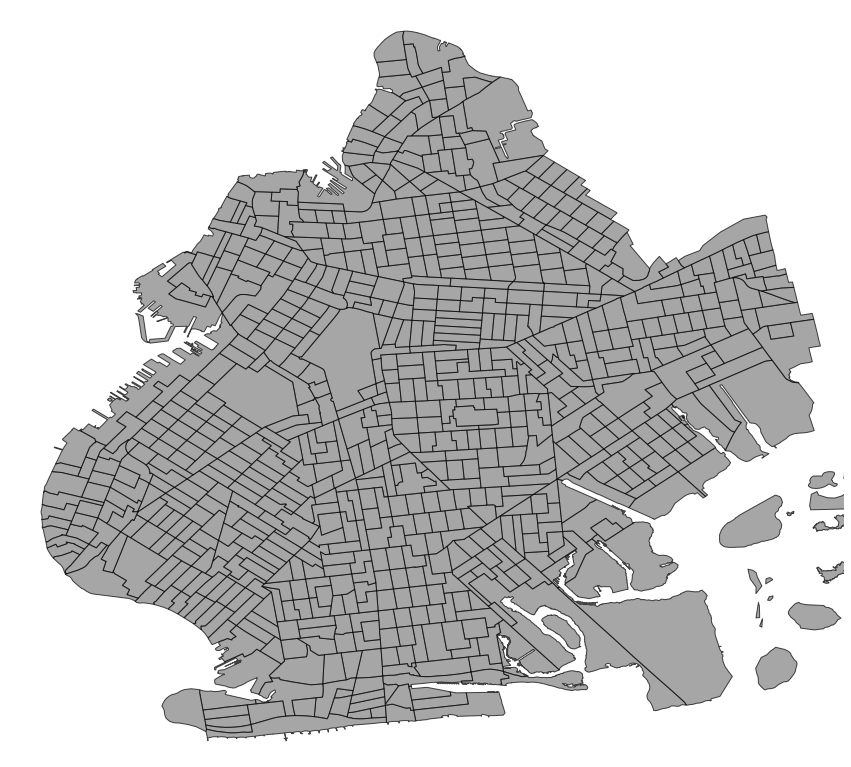

In [129]:
#brooklyn census tracts
fig,ax = plt.subplots(figsize=(15,15))

bk_census_tracts.plot(ax=ax, color='grey', alpha=.7, edgecolor='black')

set_map_axes(ax=ax)

plt.show()

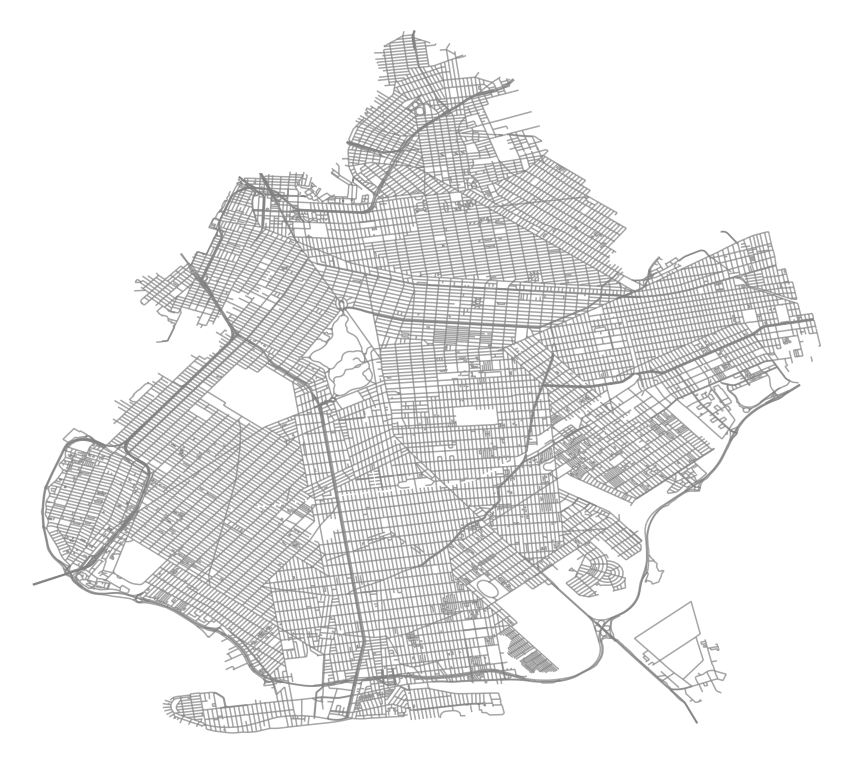

In [130]:
#brooklyn streets baselayer
fig,ax = plt.subplots(figsize=(15,15))
           
bk_base.plot(ax=ax, color='grey', alpha=.7)

set_map_axes(ax=ax)

plt.show()

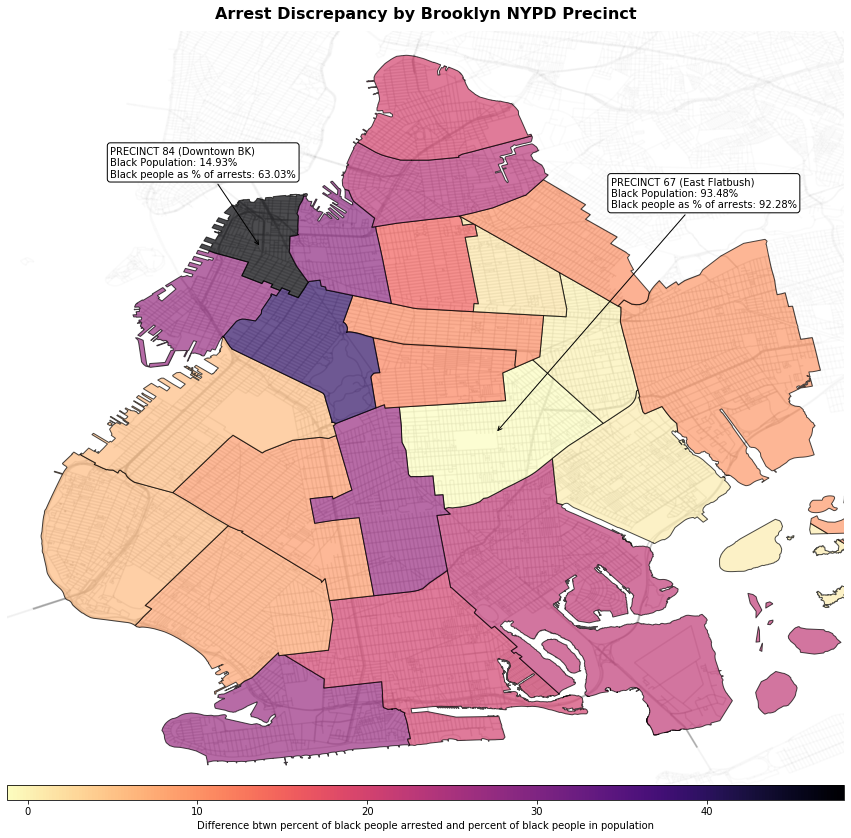

In [131]:
#Precinct arrest discrepancy
fig,ax = plt.subplots(figsize=(15,15))

divider = make_axes_locatable(ax)
cax = divider.append_axes('bottom', size='2%', pad=.01)

bk_base.plot(ax=ax, color='grey', alpha=.3, zorder=2)
notbk_base.plot(ax=ax, color='lightgrey', alpha=.1, zorder=1)

bad_precincts_shp.plot(ax=ax, column=bad_precincts_shp['diff'], cmap='magma_r', alpha=.7, zorder=3, edgecolor='black',
               legend=True, cax=cax,
               legend_kwds={'label':'Difference btwn percent of black people arrested and percent of black people in population',
                            'orientation':'horizontal'})

set_map_axes(ax=ax)

ax.annotate('PRECINCT 84 (Downtown BK) \nBlack Population: 14.93% \nBlack people as % of arrests: 63.03%', 
            xy=(-73.989518,40.693312), xycoords='data', 
            xytext=(-150,70), textcoords='offset points',
            bbox=dict(boxstyle='round',fc='w'),arrowprops=dict(arrowstyle='->'))

ax.annotate('PRECINCT 67 (East Flatbush) \nBlack Population: 93.48% \nBlack people as % of arrests: 92.28%', 
            xy=(-73.933241,40.648921), xycoords='data', 
            xytext=(115,225), textcoords='offset points',
            bbox=dict(boxstyle='round',fc='w'),arrowprops=dict(arrowstyle='->'))

ax.set_title('Arrest Discrepancy by Brooklyn NYPD Precinct', pad=12, 
             fontdict={'fontsize':16,'fontweight':'bold'})
plt.savefig('NYPD-repository/figs/arrest_disparity_by_precinct.png', dpi=500, bbox_inches='tight')
plt.show()

In [134]:
ct_combo_arrest_pop = ct_combo_arrest_pop.merge(acs_demo[['ctlabel',
                                                          'Estimate!!RACE!!Total population']], 
                                                on='ctlabel').rename(columns={'Estimate!!RACE!!Total population':
                                                                      'all_pop'})

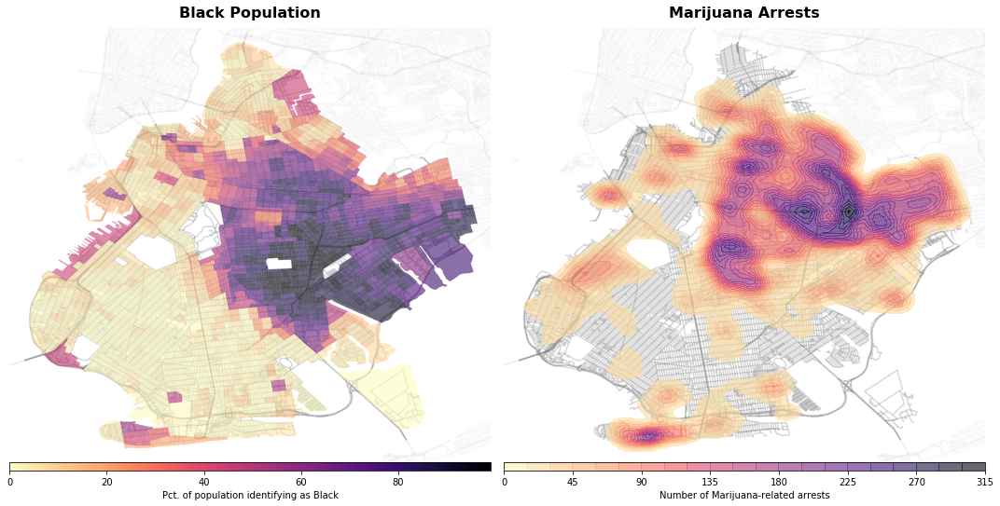

In [135]:
#Marijuana arrests KDE side by side with census tract map of black population percentage
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(15,15))


divider = make_axes_locatable(ax1)
lax = divider.append_axes('bottom', size='2%', pad=.01)

divider = make_axes_locatable(ax2)
rax = divider.append_axes('bottom', size='2%', pad=.01)

bk_base.plot(ax=ax1, color='grey', alpha=.3, zorder=2)
bk_base.plot(ax=ax2, color='grey', alpha=.3, zorder=2)
notbk_base.plot(ax=ax1, color='lightgrey', alpha=.1, zorder=1)
notbk_base.plot(ax=ax2, color='lightgrey', alpha=.1, zorder=1)

#remove census tracts with 0 population
no_nonpop = ct_combo_arrest_pop[ct_combo_arrest_pop['all_pop'] != 0]
no_nonpop.plot(ax=ax1, column=no_nonpop['perc_pop'], cmap='magma_r', alpha=.6, zorder=3, 
               legend=True, cax=lax,
               legend_kwds={'label':'Pct. of population identifying as Black',
                            'orientation':'horizontal'})

#use sample to take a random sample of the df to make plotting faster when experimenting
#sample = 100
mj_only_samp = mj_only#.sample(sample)
x = mj_only_samp['Longitude']
y = mj_only_samp['Latitude']

sns.kdeplot(x, y, ax=ax2, shade=True, alpha=.6, n_levels=20, cmap='magma_r', 
            shade_lowest=False, zorder=4,
            cbar_ax=rax, cbar=True, 
            cbar_kws={'label':"Number of Marijuana-related arrests",'orientation':'horizontal'})

set_map_axes(ax=ax1)
set_map_axes(ax=ax2)

ax1.set_title('Black Population', pad=12, 
             fontdict={'fontsize':16,'fontweight':'bold'})
ax2.set_title('Marijuana Arrests', pad=12, 
             fontdict={'fontsize':16,'fontweight':'bold'})
plt.savefig('NYPD-repository/figs/sidexside_black_pop_mj.png', dpi=500, bbox_inches='tight')
plt.tight_layout()
plt.show()

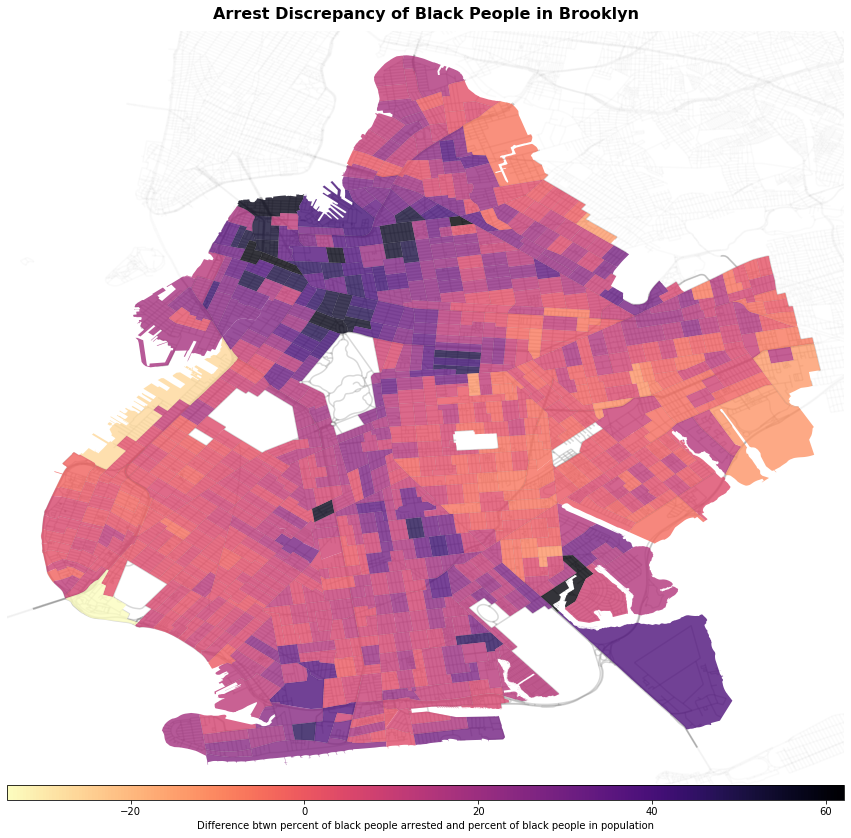

In [136]:
#brooklyn census tracts by percent arrested
fig,ax = plt.subplots(figsize=(15,15))

divider = make_axes_locatable(ax)
cax = divider.append_axes('bottom', size='2%', pad=.01)

bk_base.plot(ax=ax, color='grey', alpha=.3, zorder=2)
notbk_base.plot(ax=ax, color='lightgrey', alpha=.1, zorder=1)


#remove census tracts with 0 population
no_nonpop = ct_combo_arrest_pop[ct_combo_arrest_pop['all_pop'] != 0]

no_nonpop.plot(ax=ax, column=no_nonpop['diff'], cmap='magma_r', alpha=.8, zorder=3, 
               legend=True, cax=cax,
               legend_kwds={'label':'Difference btwn percent of black people arrested and percent of black people in population',
                            'orientation':'horizontal'})

set_map_axes(ax=ax)
ax.set_title('Arrest Discrepancy of Black People in Brooklyn', pad=12, 
             fontdict={'fontsize':16,'fontweight':'bold'})
plt.savefig('NYPD-repository/figs/arrest_disparity_by_census_tract.png', 
            dpi=500, bbox_inches='tight')
plt.show()

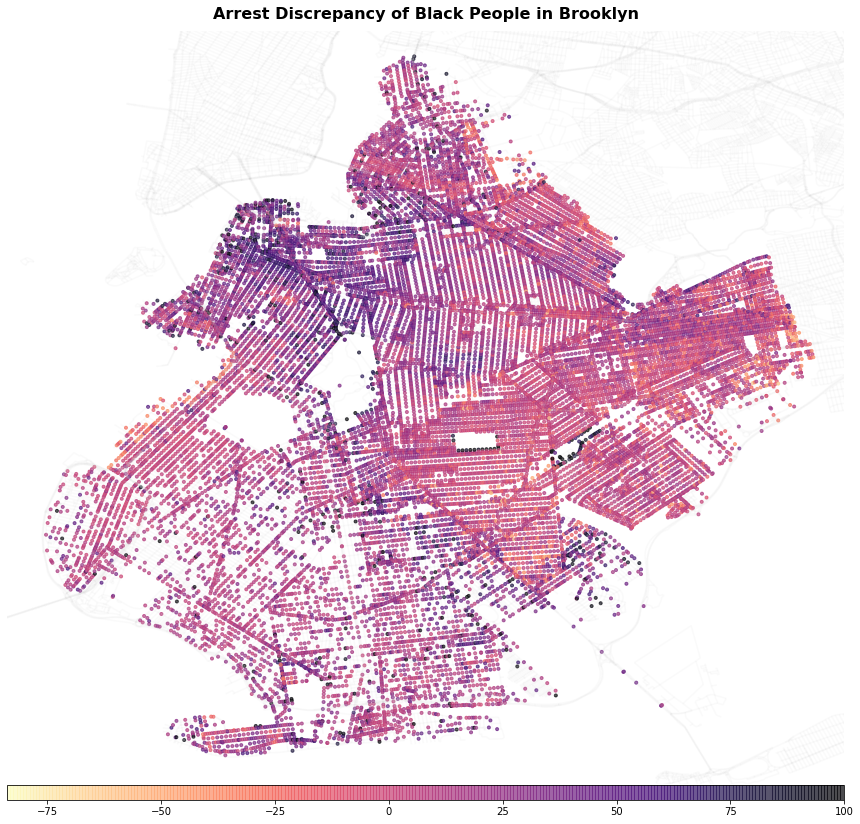

In [137]:
#brooklyn lat/lon
fig,ax = plt.subplots(figsize=(15,15))

divider = make_axes_locatable(ax)
cax = divider.append_axes('bottom', size='2%', pad=.01)

bk_base.plot(ax=ax, color='lightgrey', alpha=.1, zorder=2)
notbk_base.plot(ax=ax, color='lightgrey', alpha=.1, zorder=1)

pop0_filt = lonlat_combo_arrest_pop[lonlat_combo_arrest_pop['total_pop'] > 0]
diff = pop0_filt['diff']
im = ax.scatter(x=lonlat_combo_arrest_pop['Longitude'], y=lonlat_combo_arrest_pop['Latitude'], 
                marker='.', alpha=.7, c=lonlat_combo_arrest_pop['diff'], cmap='magma_r')

set_map_axes(ax=ax)

plt.colorbar(im, cax, orientation='horizontal')

ax.set_title('Arrest Discrepancy of Black People in Brooklyn', pad=12, 
             fontdict={'fontsize':16,'fontweight':'bold'})
plt.savefig('NYPD-repository/figs/arrest_disparity_by_latlon.png', dpi=500, bbox_inches='tight')
plt.show()

In [229]:
ct_arrest_type_max['PD_DESC_top5'].value_counts().index

Index(['Marijuana, possession 4 & 5', 'Assault 3', 'Other',
       'Controlled substance, possession 7', 'Theft of services, unclassified',
       'Traffic,unclassified infraction'],
      dtype='object')

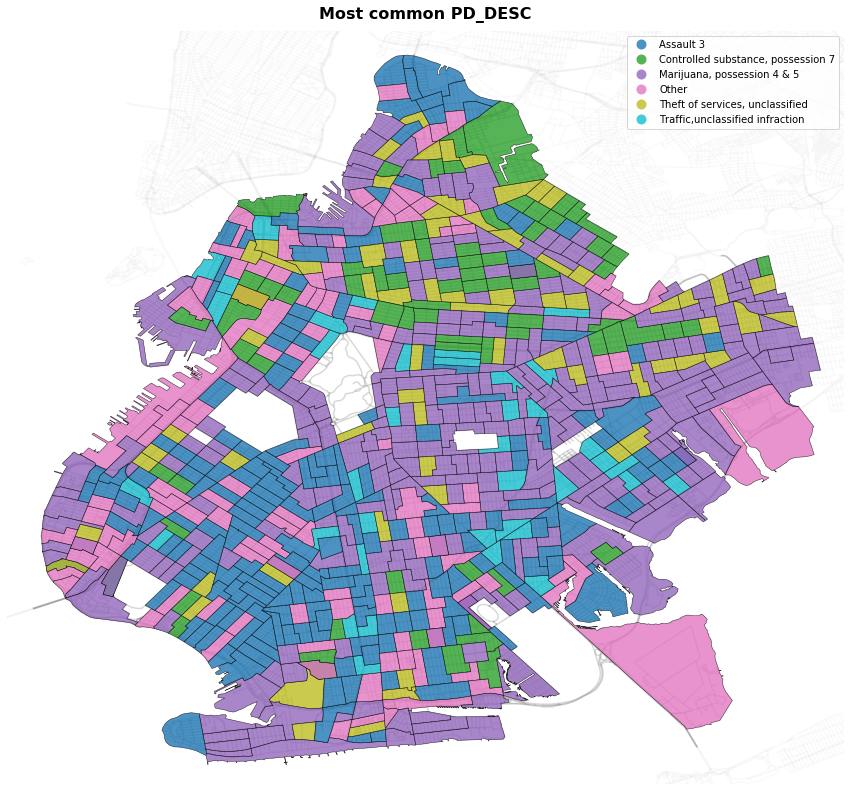

In [259]:
#brooklyn census tracts by most popular arrest type
fig,ax = plt.subplots(figsize=(15,15))

bk_base.plot(ax=ax, color='grey', alpha=.3, zorder=2)
notbk_base.plot(ax=ax, color='lightgrey', alpha=.1, zorder=1)

#remove census tracts with 0 population
no_nonpop_arrest_type = ct_arrest_type_max[ct_arrest_type_max['Estimate!!RACE!!Total population'] != 0]

ind = ct_arrest_type_max['PD_DESC_top5'].value_counts().index

colors = {ind[0]:'tab:green', ind[1]:'tab:red', 
          ind[3]:'tab:cyan',ind[4]:'tab:brown',
          ind[5]:'tab:olive',ind[2]:'tab:gray'}

no_nonpop_arrest_type.plot(ax=ax, alpha=.8, zorder=3, legend=True,
                           edgecolor='black', linewidth=.5, column=no_nonpop_arrest_type['PD_DESC_top5'])

set_map_axes(ax=ax)
ax.set_title('Most common PD_DESC', pad=12, 
             fontdict={'fontsize':16,'fontweight':'bold'})
plt.savefig('NYPD-repository/figs/top5_PD_DESC_by_census_tract.png', dpi=500, bbox_inches='tight')
plt.show()

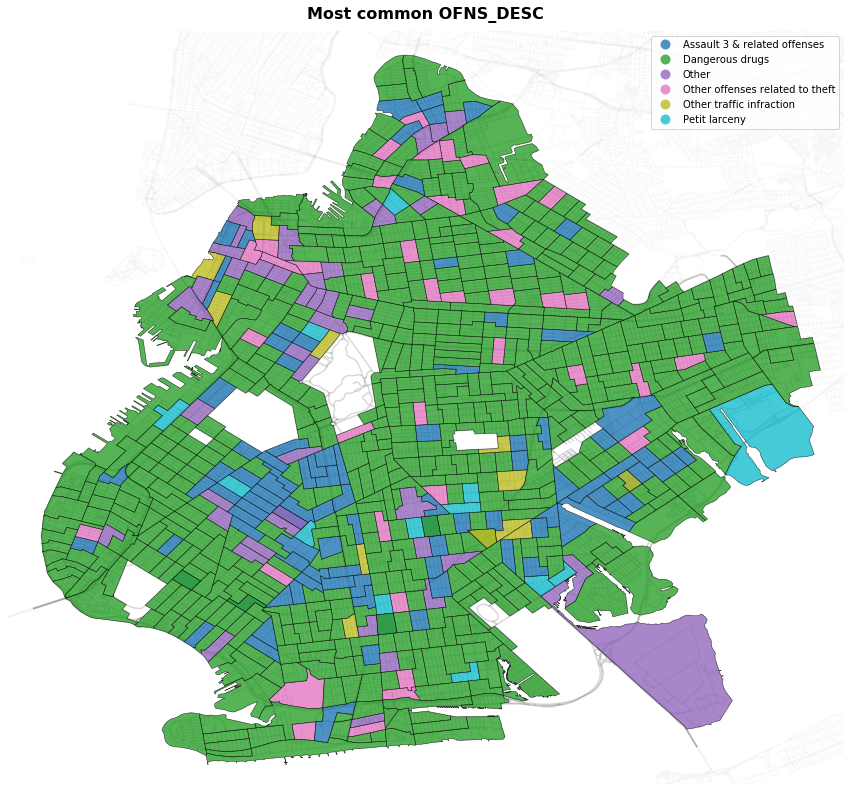

In [261]:
#brooklyn census tracts by most popular OFNS_DESC
fig,ax = plt.subplots(figsize=(15,15))

bk_base.plot(ax=ax, color='grey', alpha=.3, zorder=2)
notbk_base.plot(ax=ax, color='lightgrey', alpha=.1, zorder=1)

#remove census tracts with 0 population
no_nonpop_arrest_ofns_desc = ct_arrest_ofns_desc_max[
    ct_arrest_ofns_desc_max['Estimate!!RACE!!Total population'] != 0]

ind = ct_arrest_ofns_desc_max['OFNS_DESC_top5'].value_counts().index

colors = {ind[0]:'tab:green', ind[1]:'tab:red', 
          ind[3]:'tab:cyan',ind[4]:'tab:brown',
          ind[5]:'tab:olive',ind[2]:'tab:gray'}

no_nonpop_arrest_ofns_desc.plot(ax=ax, alpha=.8, zorder=3, legend=True,
                           edgecolor='black', linewidth=.5, column=no_nonpop_arrest_ofns_desc['OFNS_DESC_top5'])

set_map_axes(ax=ax)
ax.set_title('Most common OFNS_DESC', pad=12, 
             fontdict={'fontsize':16,'fontweight':'bold'})
plt.savefig('NYPD-repository/figs/top5_OFNS_DESC_by_census_tract.png', dpi=500, bbox_inches='tight')
plt.show()

### Some prep for maps

In [149]:
#get a set of columns that does not include lon/lat
cols = df.columns.to_list()
cols.remove('Latitude')
cols.remove('Longitude')
cols

['ARREST_KEY',
 'ARREST_DATE',
 'PD_CD',
 'PD_DESC',
 'KY_CD',
 'OFNS_DESC',
 'LAW_CODE',
 'LAW_CAT_CD',
 'ARREST_BORO',
 'ARREST_PRECINCT',
 'JURISDICTION_CODE',
 'AGE_GROUP',
 'PERP_SEX',
 'PERP_RACE',
 'X_COORD_CD',
 'Y_COORD_CD',
 'ARREST_YEAR',
 'ARREST_MONTH',
 'ARREST_DAY',
 'lonlat',
 'point',
 'geometry',
 'dayofyear']

In [150]:
#find the percent of each each race present at each lon/lat
race_size = df.groupby(['Latitude','Longitude','PERP_RACE']).size()
race_pct = race_size.groupby(level=[0,1]).apply(lambda x: 100 * x / float(x.sum()))

In [151]:
race_pct

Latitude   Longitude   PERP_RACE               
40.571859  -73.997878  ASIAN / PACIFIC ISLANDER      0.775194
                       BLACK                        58.914729
                       HISPANIC                     33.333333
                       UNKNOWN                       0.775194
                       WHITE                         6.201550
                                                      ...    
40.738235  -73.952845  HISPANIC                    100.000000
40.738549  -73.955335  BLACK                        38.461538
                       HISPANIC                     26.923077
                       WHITE                        34.615385
40.738863  -73.952729  BLACK                       100.000000
Length: 76016, dtype: float64

In [152]:
#rename column 0 as 'race_pct'
df_race_pct = race_pct.reset_index().rename(columns={0:'race_pct'})

In [153]:
#return most common arrest race for each lon/lat
#1. groupby lon/lat and reutrn column of race_pct organized by max percent
#2. reset the index
#3. merge back with the original race pct dataframe to get the lat/lon values 
df_max_race = df_race_pct.groupby(['Latitude','Longitude'])['race_pct'].max().reset_index().merge(df_race_pct, on=['Latitude','Longitude','race_pct'])


In [154]:
#add boro column to max_race df
df_max_race_boro = df_max_race.merge(df[['Latitude','Longitude','ARREST_BORO']], on=['Latitude','Longitude'])

### Slightly older Maps

Now we have a dataframe organized by each unqiue set of (long, lat, race) with a value for how common each race is at that unique longitude and latitude
With this unique information, we want to plot the following on a map:
- Color for the dominant race
- That color changes depending on how dominant it is at that lon/lat
- Does the color change depending on the make up of the races?
    - Black -> White -> Hispanic is diffent then White -> Hispanic -> Black?
    - or could it be compared to the racial breakdown of that area?
        - Black people are mis-represented in this arrest data by this percent...
        
I think final answer for now is to group by the majority race and then create a bubble that shows the size of arrests at that lat/lon location
- scatter by lat/lon and color by race category

In [155]:
df_max_race_boro['PERP_RACE'].value_counts(normalize=True)

BLACK                             0.729456
HISPANIC                          0.161450
WHITE                             0.101963
ASIAN / PACIFIC ISLANDER          0.006858
UNKNOWN                           0.000219
AMERICAN INDIAN/ALASKAN NATIVE    0.000041
OTHER                             0.000013
Name: PERP_RACE, dtype: float64

NameError: name 'declutter_axes' is not defined

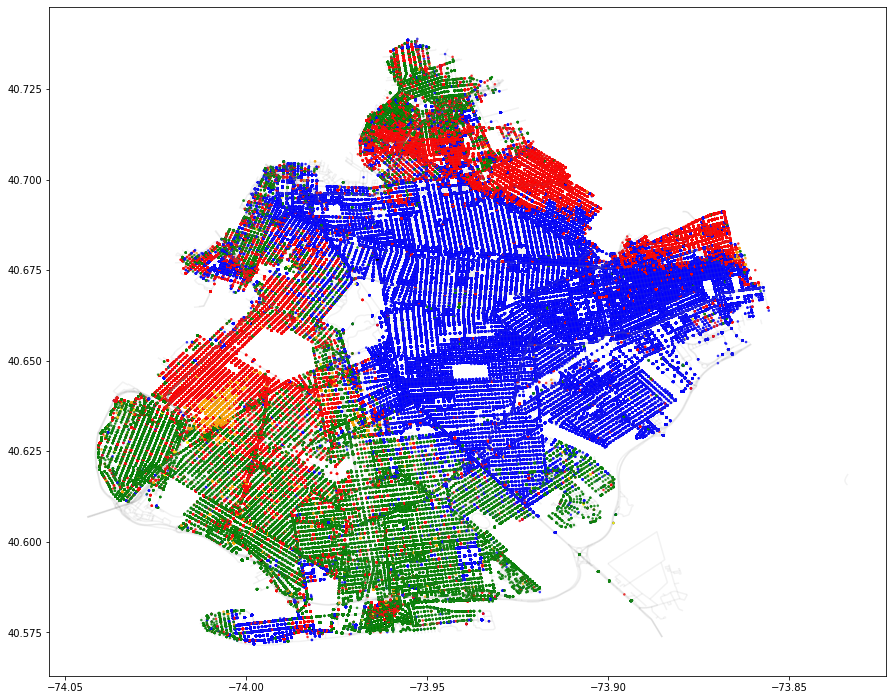

In [156]:
#map the MOST arrested race at each lat/lon
fig,ax = plt.subplots(figsize=(15,15))

bk_base.plot(ax=ax, color='grey', alpha=.1)

marker = '.'
alpha = .7
s = 10

colors = {'WHITE':'green', 'ASIAN / PACIFIC ISLANDER':'orange', 'HISPANIC':'red', 'BLACK':'blue', 
          'UNKNOWN':'yellow', 'AMERICAN INDIAN/ALASKAN NATIVE':'purple', 'OTHER':'black'}

ax.scatter(df_max_race_boro[(df_max_race_boro['ARREST_BORO'] == 'K') &
                            (df_max_race_boro['Latitude'] < 40.8)]['Longitude'], 
           df_max_race_boro[(df_max_race_boro['ARREST_BORO'] == 'K') &
                            (df_max_race_boro['Latitude'] < 40.8)]['Latitude'], 
           c=df_max_race_boro[(df_max_race_boro['ARREST_BORO'] =='K') &
                            (df_max_race_boro['Latitude'] < 40.8)]['PERP_RACE'].apply(lambda x: colors[x]), 
           alpha=alpha, marker=marker, s=s)

declutter_axes(ax=ax)


plt.show()

In [ ]:
#map the MOST arrested race at each lat/lon and marker size changes depending on total number of arrests

In [ ]:
num_arrests = df[(df['ARREST_BORO'] == 'K') & (df['Latitude'] < 40.8)].groupby(['Latitude','Longitude']).size().reset_index().rename(columns={0:'tot_arrests'})

In [ ]:
brooklyn = df[(df['ARREST_BORO'] == 'K') & (df['Latitude'] < 40.8)]

In [ ]:
#map the MOST arrested race at each lat/lon
fig,ax = plt.subplots(figsize=(15,15))

bk_base.plot(ax=ax, color='grey', alpha=.1)

marker = '.'
alpha = .7
s = 10

colors = {'WHITE':'green', 'ASIAN / PACIFIC ISLANDER':'orange', 'HISPANIC':'red', 'BLACK':'blue', 
          'UNKNOWN':'yellow', 'AMERICAN INDIAN/ALASKAN NATIVE':'purple', 'OTHER':'black'}

ax.scatter(brooklyn['Longitude'], 
           brooklyn['Latitude'], 
           c=brooklyn['PERP_RACE'].apply(lambda x: colors[x]), 
           alpha=alpha, marker=marker, s=s)

declutter_axes(ax=ax)

plt.show()

In [ ]:
brooklyn.head()

### KDE PLOT (takes 30 min to run)

fig, ax = plt.subplots(figsize=(15,15))

divider = make_axes_locatable(ax)
cax = divider.append_axes('bottom', size='2%', pad=.01)

#sample = 100
bk_sample = brooklyn[brooklyn['PERP_RACE'] == 'BLACK']#.sample(sample)
x = bk_sample['Longitude']
y = bk_sample['Latitude']
sns.kdeplot(x, y, ax=ax, shade=True, alpha=1, n_levels=20, cmap='magma_r', shade_lowest=False, zorder=2,
            cbar_ax=cax, cbar=True, 
            cbar_kws={'label':"Number of Black People Arrested in Brooklyn, NY ('06-'19)",
                      'orientation':'horizontal'})

bk_base.plot(ax=ax, color='grey', alpha=.2, zorder=3)
notbk_base.plot(ax=ax, color='lightgrey', alpha=.1, zorder=1)

ax.set_xlim(-74.050,-73.850)
ax.set_ylim(40.565,40.745)

declutter_axes(ax=ax)

#plt.savefig('figs/black_arrest_density.png', dpi=500, bbox_inches='tight')
plt.show()